# Data-insight-assement

## Setup

In [13]:
import pandas as pd
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
import altair as alt
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [14]:
df = pd.read_csv('data/campaigns.csv')

In [15]:
def plot_histogram(coluna, df):
    chart = alt.Chart(df).mark_bar().encode(alt.X(coluna, bin=True),y='count()',tooltip = 'count()').interactive()
    return chart
    

## Consistancy exploration

In [5]:
#Missing values - ok
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40690 entries, 0 to 40689
Data columns (total 18 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  40690 non-null  int64 
 1   age         40690 non-null  int64 
 2   job         40690 non-null  object
 3   marital     40690 non-null  object
 4   education   40690 non-null  object
 5   default     40690 non-null  object
 6   balance     40690 non-null  int64 
 7   housing     40690 non-null  object
 8   loan        40690 non-null  object
 9   contact     40690 non-null  object
 10  day         40690 non-null  int64 
 11  month       40690 non-null  object
 12  duration    40690 non-null  int64 
 13  campaign    40690 non-null  int64 
 14  pdays       40690 non-null  int64 
 15  previous    40690 non-null  int64 
 16  poutcome    40690 non-null  object
 17  y           40690 non-null  object
dtypes: int64(8), object(10)
memory usage: 5.6+ MB


In [9]:
# Class balance
df.y.value_counts() / df.y.value_counts().sum()

no     0.882354
yes    0.117646
Name: y, dtype: float64

In [11]:
#Dtypes
df.dtypes.value_counts()

object    10
int64      8
dtype: int64

In [12]:
#first rows
df.head()

,Unnamed: 0,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [16]:
#first cleaning
df.drop(columns = 'Unnamed: 0', inplace = True)

In [17]:
#creating a dataframe for summarise data info
df_summary = pd.DataFrame({'colunas': df.columns, 'tipos' : df.dtypes, 'unicos': df.nunique()})

In [18]:
#printing
df_summary

,colunas,tipos,unicos
age,age,int64,77
job,job,object,12
marital,marital,object,3
education,education,object,4
default,default,object,2
balance,balance,int64,6903
housing,housing,object,2
loan,loan,object,2
contact,contact,object,3
day,day,int64,31


In [19]:
#lists for data manipulation
colunas_numericas = list(df_summary[df_summary['tipos'] == 'int64']['colunas'])
colunas_categoricas = list(df_summary[df_summary['tipos'] == 'object']['colunas'])
colunas_categoricas.remove('y')

## Deep dive

In [20]:
#describing numeric features
df[colunas_numericas].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
age,40690.0,40.905407,10.604908,18.0,33.0,39.0,48.0,95.0
balance,40690.0,1359.697518,3034.248783,-8019.0,74.0,451.0,1423.0,102127.0
day,40690.0,15.808405,8.318281,1.0,8.0,16.0,21.0,31.0
duration,40690.0,258.243844,257.577068,0.0,103.0,180.0,319.0,4918.0
campaign,40690.0,2.764586,3.110158,1.0,1.0,2.0,3.0,63.0
pdays,40690.0,40.059867,100.078281,-1.0,-1.0,-1.0,-1.0,871.0
previous,40690.0,0.579405,2.350664,0.0,0.0,0.0,0.0,275.0


age


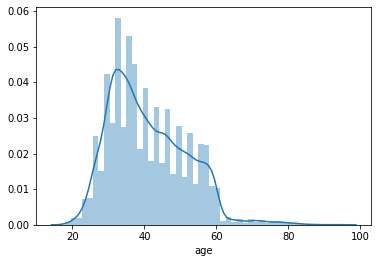

balance


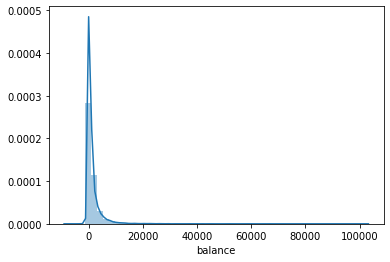

day


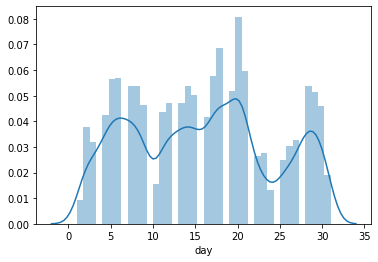

duration


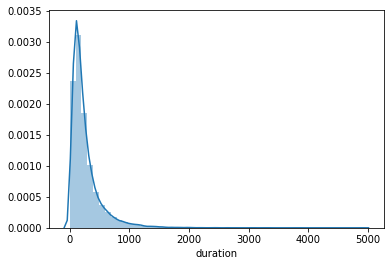

campaign


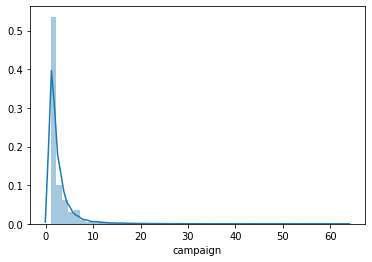

pdays


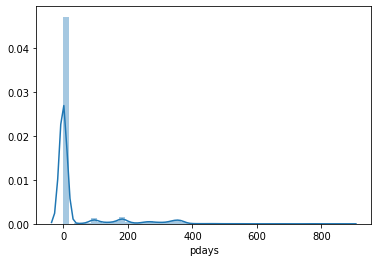

previous


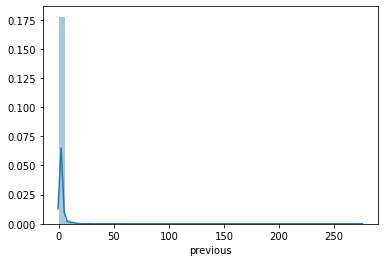

In [32]:
#plot distribuiton
for coluna in colunas_numericas:
    print(coluna)
    sns.distplot(df[coluna])
    plt.show()

In [34]:
#skewness
df[colunas_numericas].skew()

age          0.683497
balance      8.410197
day          0.093281
duration     3.138967
campaign     4.931345
pdays        2.631138
previous    43.468428
dtype: float64

In [38]:
#kurtosis
df[colunas_numericas].kurtosis()

age            0.323161
balance      142.803251
day           -1.058766
duration      18.148298
campaign      39.859297
pdays          7.047275
previous    4615.651380
dtype: float64

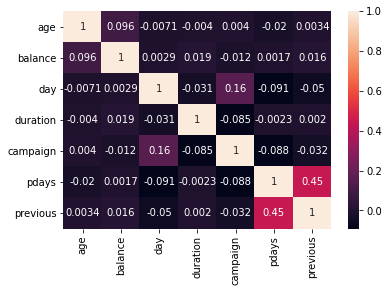

In [41]:
#pearson correlation
sns.heatmap(df[colunas_numericas].corr(method = 'pearson'),annot= True)

### Considerações:
- Age: Média próxima da mediana, queda brusca no número de observações após 60 anos de idade
- Balance: Grande assímetria, 50% das observações entre 74 - 1423 RS, outliers influenciam a média
- day : Ligeira queda no volume de dados entre os dias 20 - 30 do mes
- Duration: Positive skew, 50% das observações entre 103 - 319 segundos.
- Campaign: Maioria dos clientes (75%) foram contatados até 3 vezes. 
- pdays: Maioria dos clientes não tiveram contato com a campanha.pdays = -1
- previous: Antes da campanha, a maioria dos clientes nunca havia sido contatado. previous = 0
- As features não estão correlacionadas.

### Perguntas:
- Age: Qual a faixa etária com maior adesão?
- Balance: Adesão ocorre em maior proporção em pessoas mais abastadas?
- Day: Dia influência? Período do mês início/ fim ?
- Duration: Tempo de contato influência? Podemos criar categorias?
- Campagain: Quantidade de contatos influencia a adesão?
- pdays: Faz sentido binarizar o pdays = -1 ?
- previous: Cruzar com o target e ver variaçao, talvez não seja uma feature relevante observando sua distribuição.


job


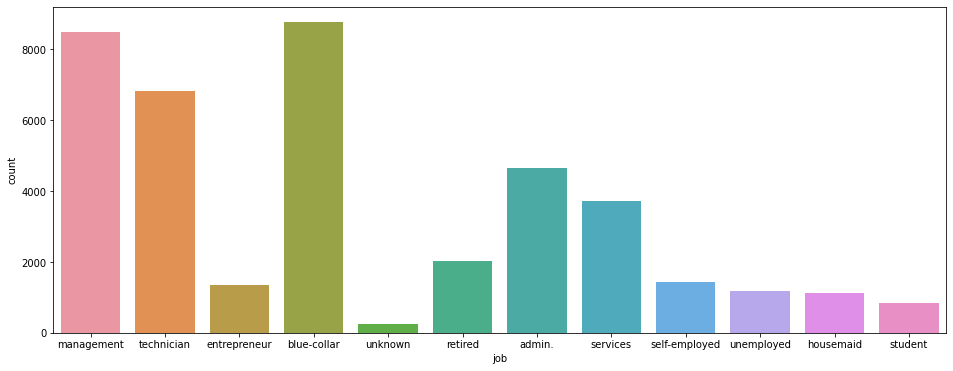

marital


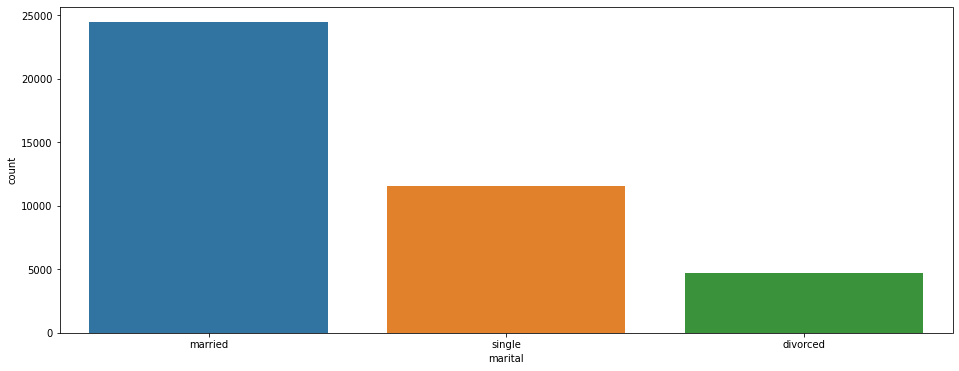

education


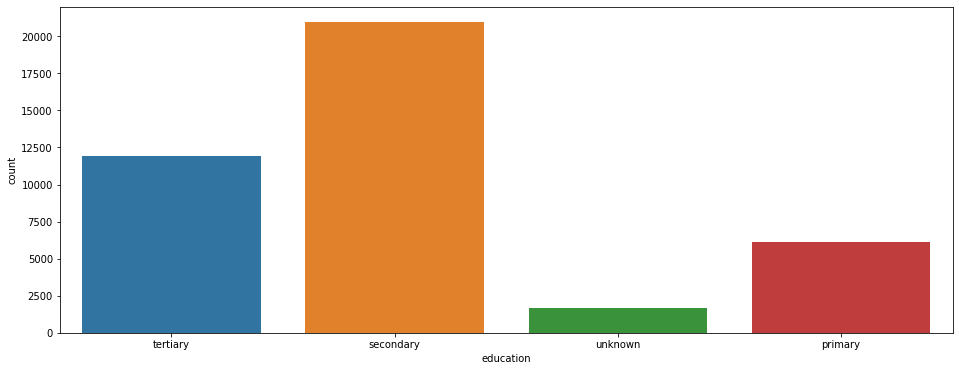

default


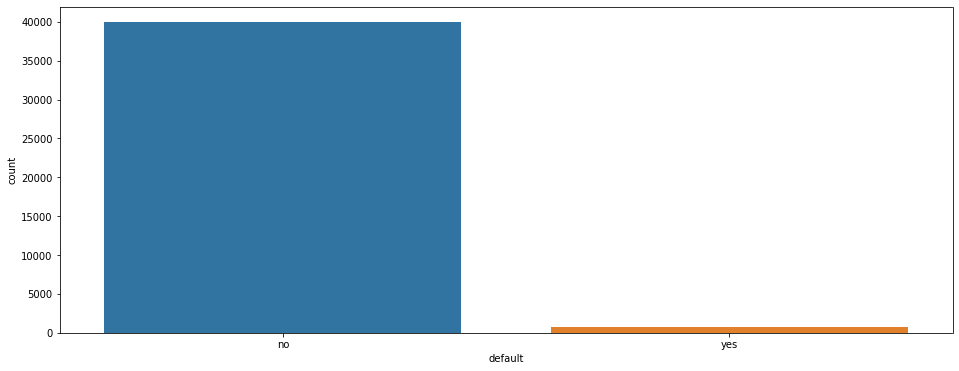

housing


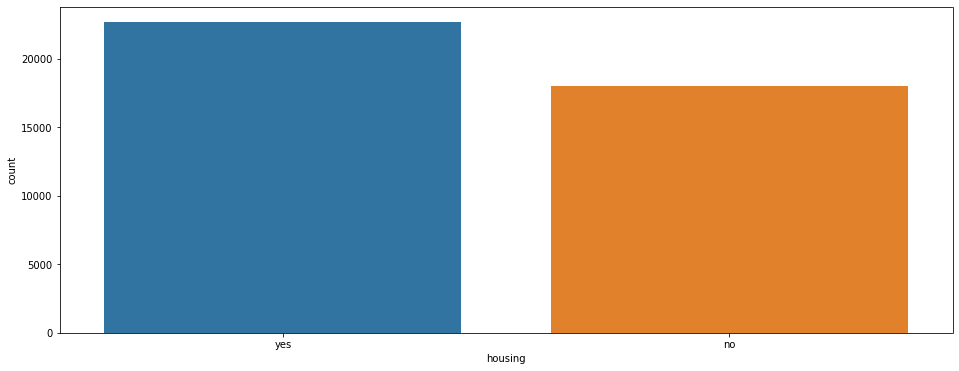

loan


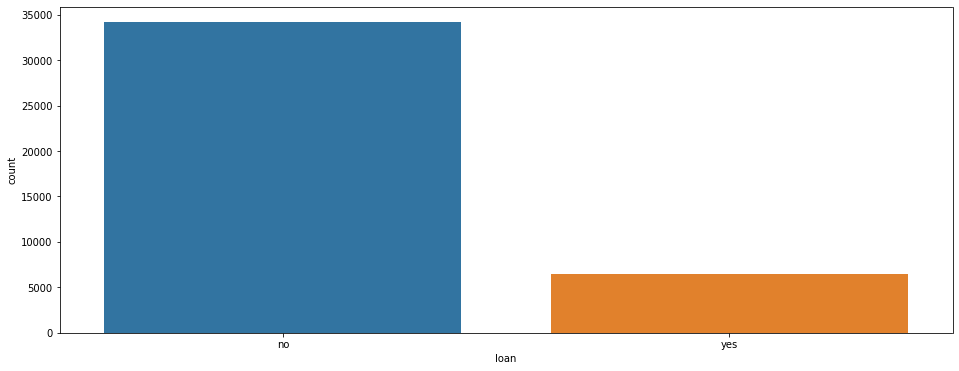

contact


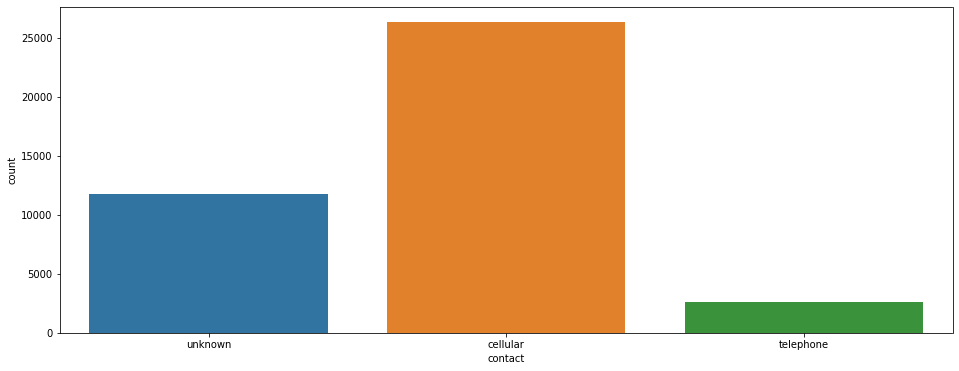

month


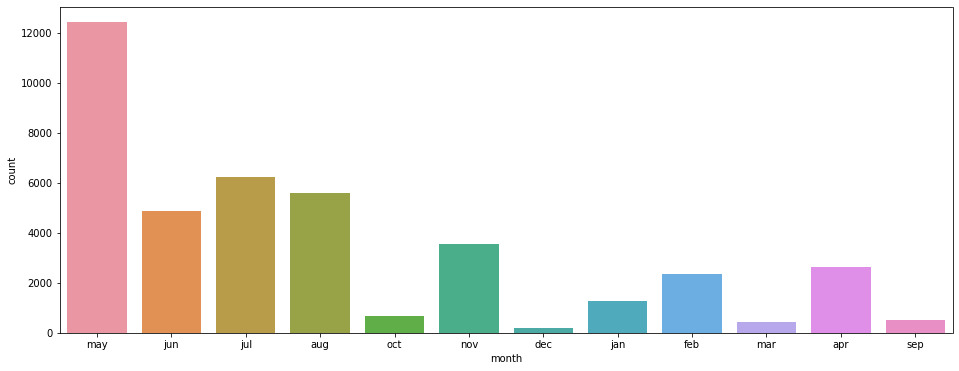

poutcome


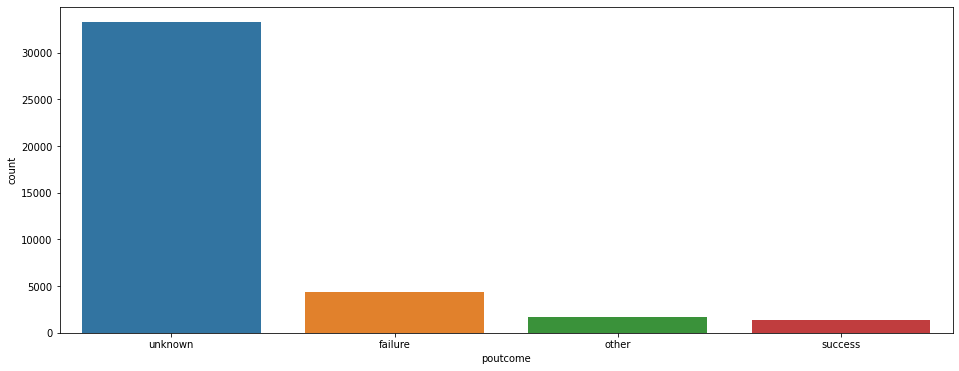

In [40]:
#class balance between categoric features
for coluna in colunas_categoricas:
    print(coluna)
    plt.figure(figsize= (16,6))
    sns.countplot(df[coluna])
    plt.show()

### Considerações:

- job: Maioria da base é managment, technician ou blue-collar.
- marital: Maioria da base é casada.
- education: Maioria ensino médio ou mais.
- default: Maioria não tem crédito default.
- housing: Maioria da base tem um emprestimo para casa.
- contact: Maioria prefere contato via celular. 
- month: Discrepancia entre o volume de observações por meses, alguns meses como dezembro, outubro e março apresentam pouquissimas observações.
- poutcome: Maioria de fonte desconhecida.

### Perguntas:

- job: Adesão mais frequente em algum profissão especifica?
- marital: Adesão mais frequente entre os casados?
- education: Educação influência a adesão?
- default: É uma feature relevante tendo em vista a proporção entre as observações? 
- housing: Empréstimo de casa influência a adesão?
- contact: Feature é relevante? O tipo do contato pode influenciar a adesão do produto?
- month: Faz sentido agregar em semestre/ trimestre para tratar os meses com baixa representatividade?
- poutcome: Faz sentido manter esta feature sabendo que a maioria é desconhecido? 

In [50]:
alt.Chart(df).mark_circle().encode(
    x='age',
    y='duration',
    color='y',
    tooltip=['age', 'balance','job', 'education', 'duration', 'y']
).interactive()

alt.Chart(...)

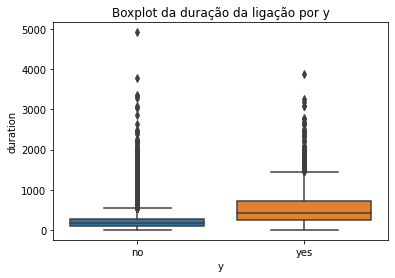

In [54]:
sns.boxplot(x = 'y', y = 'duration', data = df)
plt.title('Boxplot da duração da ligação por y')
plt.show()

- Nota-se que a distribuição do tempo de duração da ligação em segundos apresenta comportamento diferente entre as pessoas que aderiram ao produto e as que não.

In [95]:
df[df['y'] == 'yes'].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
age,4787.0,41.612283,13.503605,18.0,31.0,38.0,50.0,95.0
balance,4787.0,1794.342177,3360.000804,-3058.0,206.5,730.0,2147.0,81204.0
day,4787.0,15.138709,8.463731,1.0,8.0,15.0,21.5,31.0
duration,4787.0,538.449760,394.443620,8.0,244.0,426.0,728.0,3881.0
campaign,4787.0,2.138918,1.857132,1.0,1.0,2.0,3.0,24.0
pdays,4787.0,69.009609,118.839444,-1.0,-1.0,-1.0,98.0,854.0
previous,4787.0,1.175684,2.574719,0.0,0.0,0.0,2.0,58.0


In [96]:
df[df['y'] != 'yes'].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
age,35903.0,40.811158,10.152623,18.0,33.0,39.0,48.0,95.0
balance,35903.0,1301.745704,2983.404652,-8019.0,59.0,419.0,1346.0,102127.0
day,35903.0,15.897697,8.294730,1.0,8.0,16.0,21.0,31.0
duration,35903.0,220.883575,206.365652,0.0,95.0,164.0,279.0,4918.0
campaign,35903.0,2.848007,3.231705,1.0,1.0,2.0,3.0,63.0
pdays,35903.0,36.199955,96.652895,-1.0,-1.0,-1.0,-1.0,871.0
previous,35903.0,0.499903,2.307582,0.0,0.0,0.0,0.0,275.0


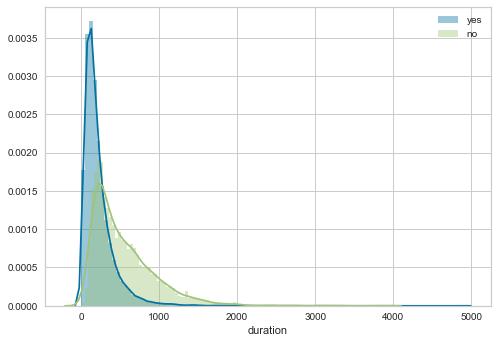

In [105]:
sns.distplot(df[df['y'] != 'yes']['duration'],label= 'yes', bins = 100,kde=True)
sns.distplot(df[df['y'] == 'yes']['duration'], label= 'no', bins = 100, kde=True)
plt.legend()
plt.show()

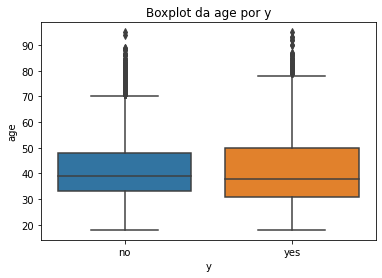

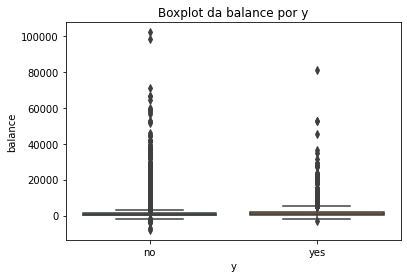

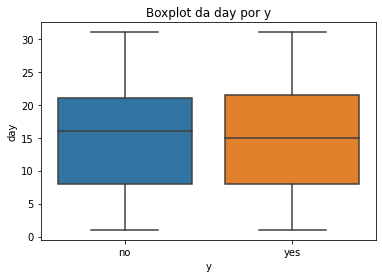

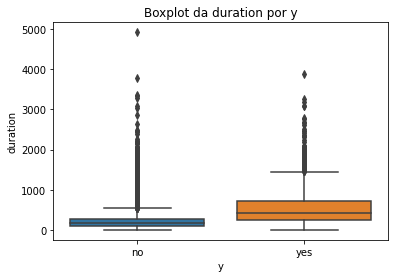

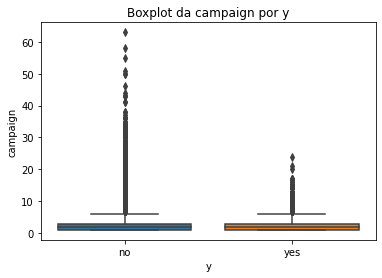

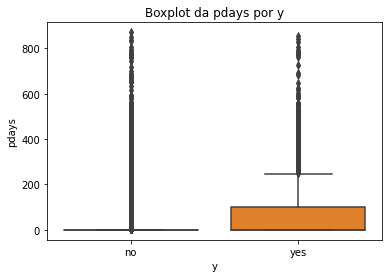

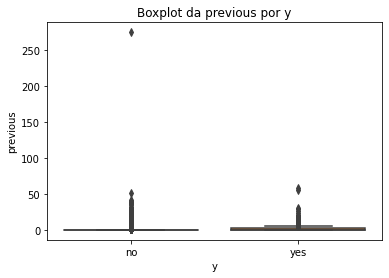

In [55]:
for coluna in colunas_numericas:
    plt.title('Boxplot da '+ coluna + ' por y')
    sns.boxplot(x = 'y', y = coluna, data = df)
    plt.show()

job


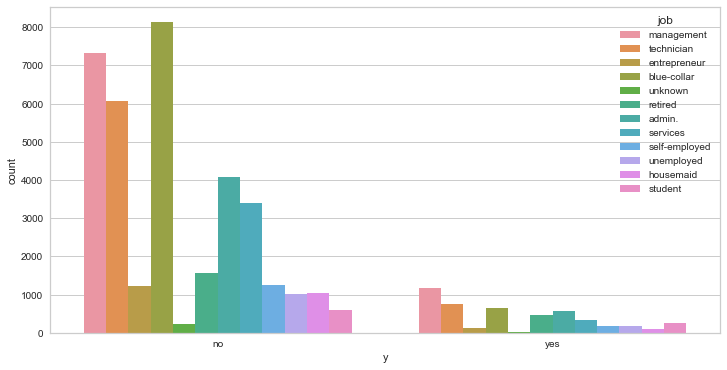

marital


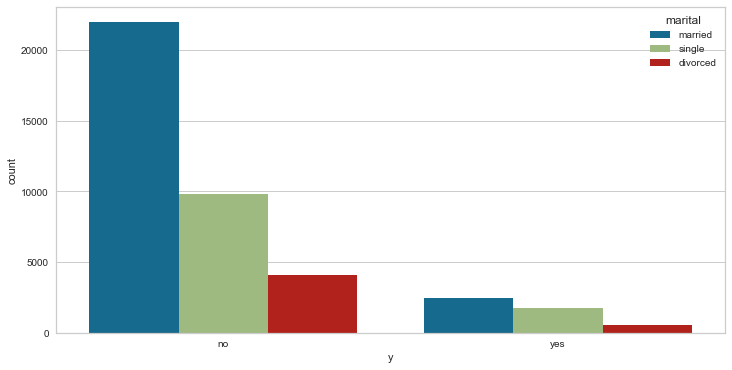

education


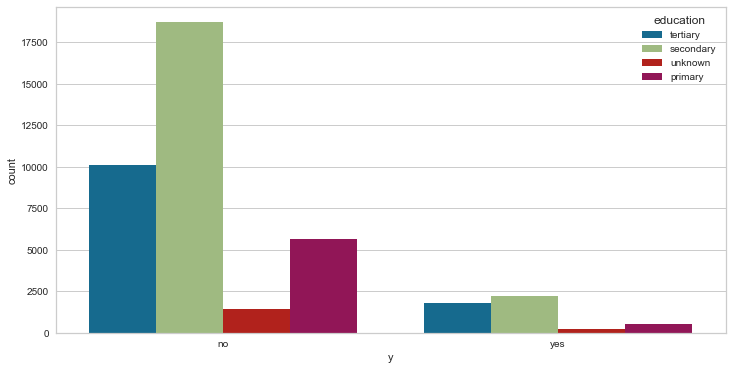

default


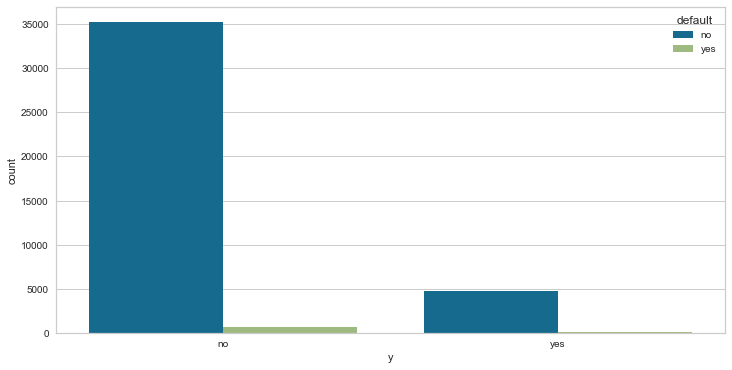

housing


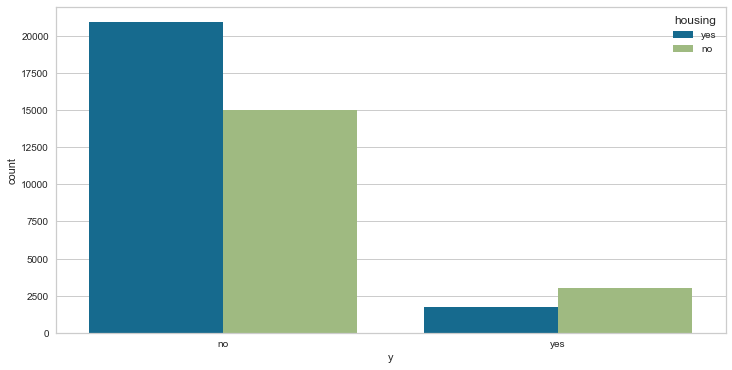

loan


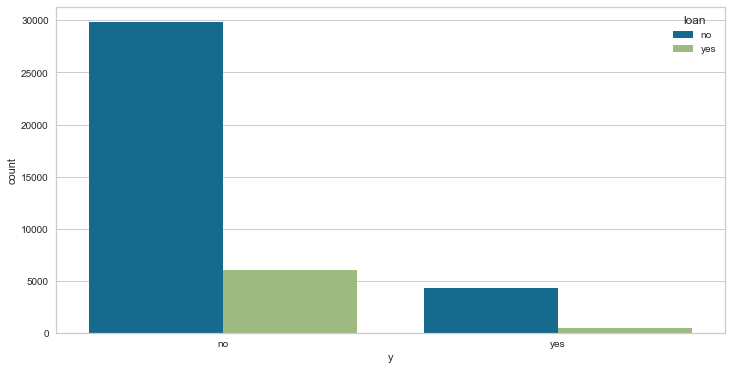

contact


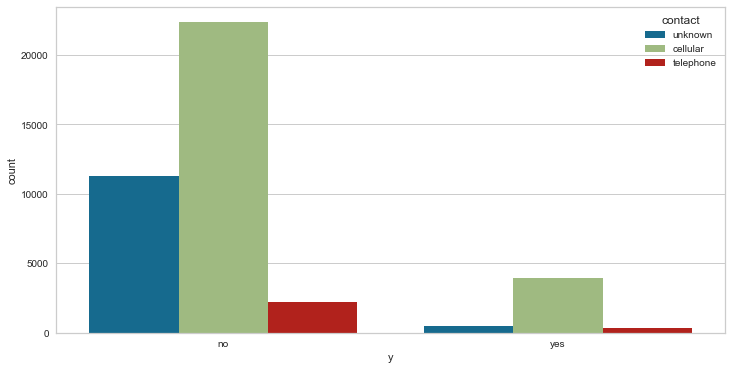

month


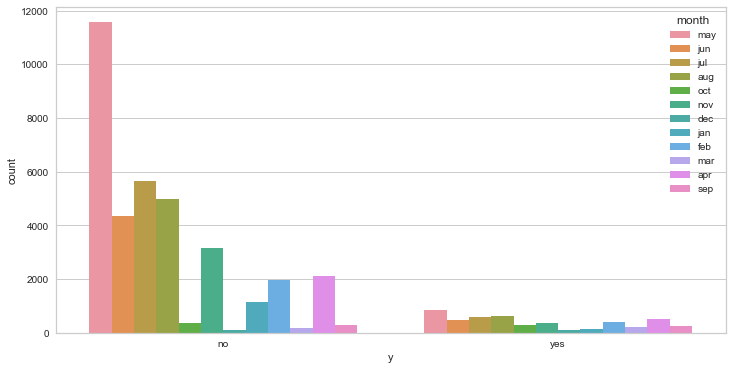

poutcome


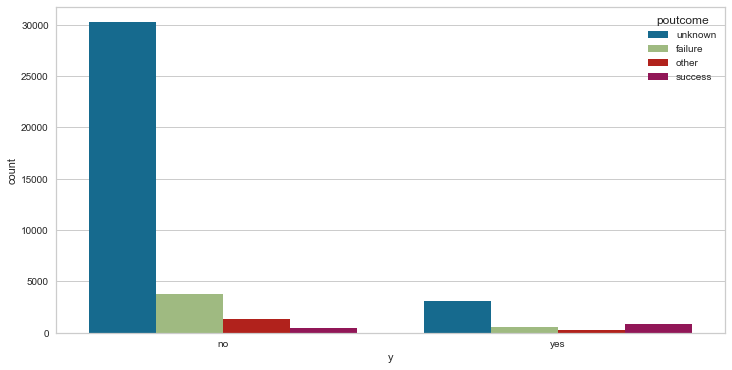

In [83]:
for coluna in colunas_categoricas:
    print(coluna)
    plt.figure(figsize = (12,6))
    sns.countplot('y', hue = coluna, data = df)
    plt.show()

job


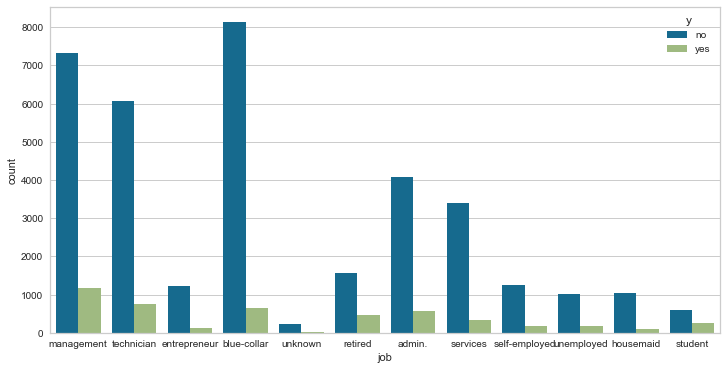

marital


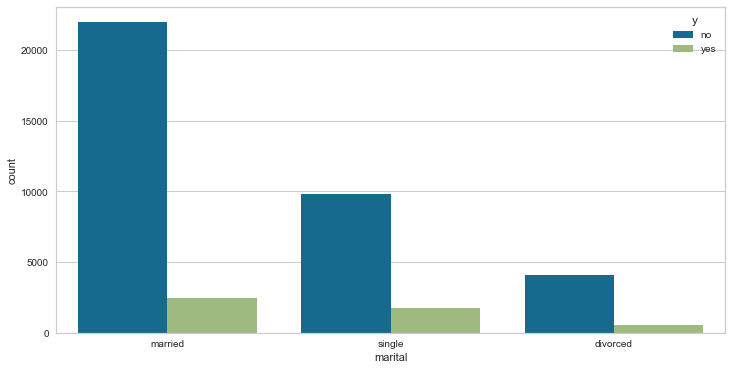

education


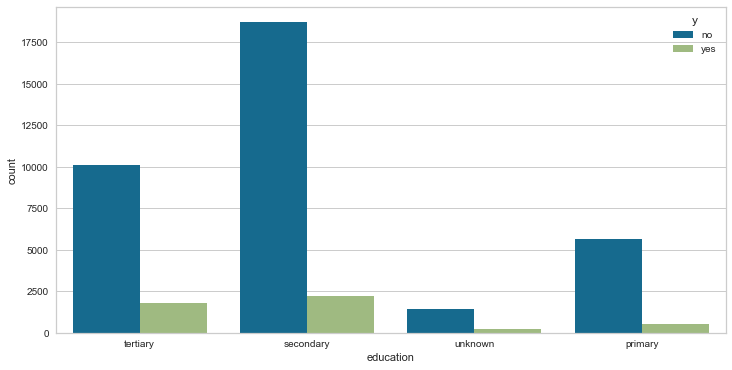

default


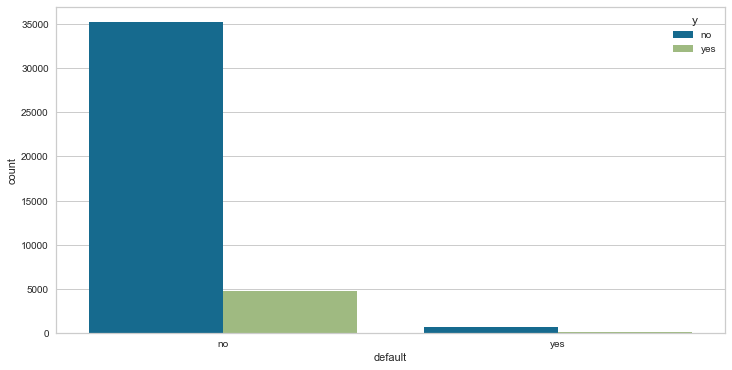

housing


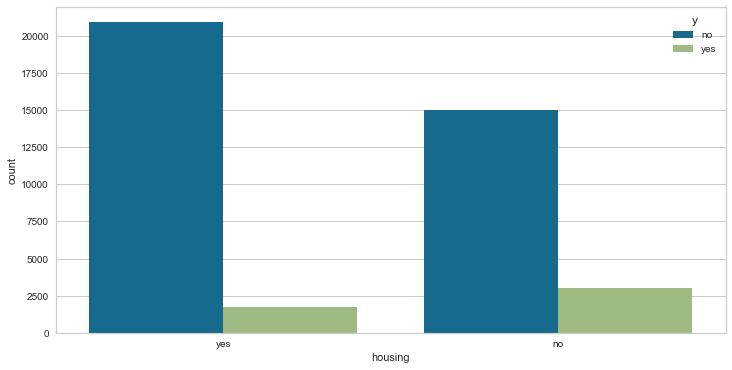

loan


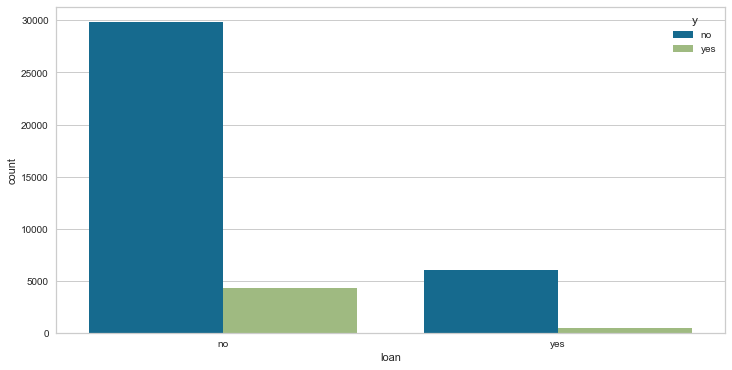

contact


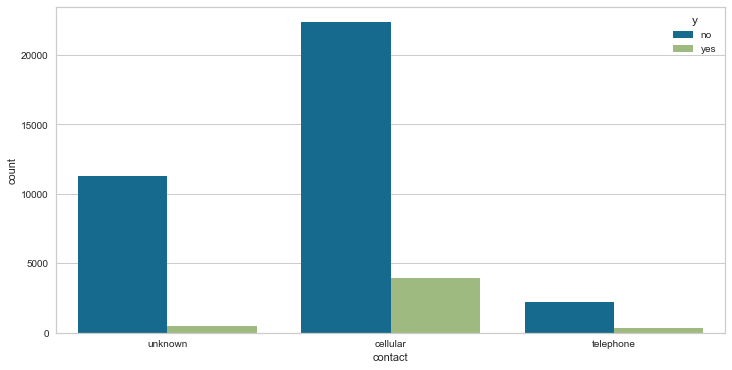

month


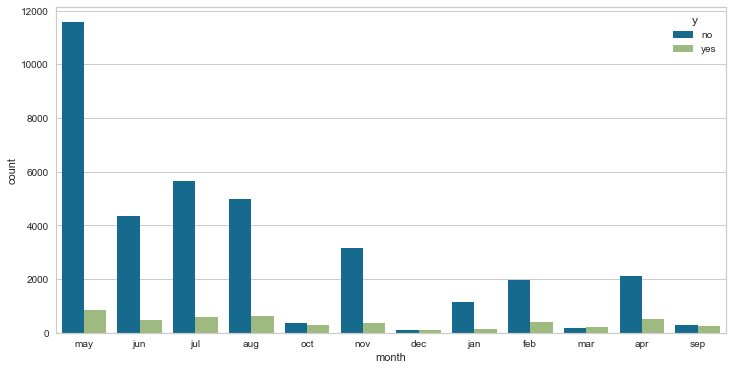

poutcome


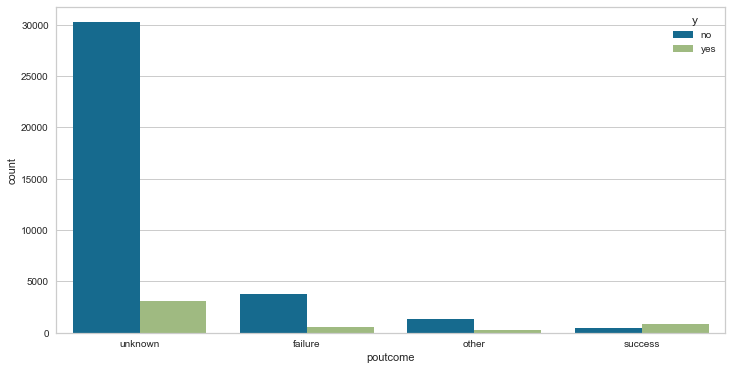

In [84]:
for coluna in colunas_categoricas:
    print(coluna)
    plt.figure(figsize = (12,6))
    sns.countplot(coluna, hue = 'y', data = df)
    plt.show()

## Feature Creation

- binária: Duration > 220 
- binária: pdays > 36
- binária: periodo do mes(inicio / fim)
- binária: semeste 

In [106]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'y'],
      dtype='object')

In [108]:
df.month.unique()

array(['may', 'jun', 'jul', 'aug', 'oct', 'nov', 'dec', 'jan', 'feb',
       'mar', 'apr', 'sep'], dtype=object)

In [4]:
primeiro_semestre = ['jan', 'feb','mar', 'apr', 'may', 'jun']

In [20]:
df['bool_duration'] = [1 if x > 220 else 0 for x in df['duration']]
df['bool_pdays'] = [1 if x > 36 else 0 for x in df['pdays']]
df['bool_periodomes'] = [1 if x > 15 else 0 for x in df['day']]


In [21]:
df['bool_periodoano'] = df['month'].isin(primeiro_semestre)
df['bool_periodoano'] = [1 if x == True else 0 for x in df['bool_periodoano']]

In [22]:
lista = ['bool_duration', 'bool_pdays', 'bool_periodomes', 'bool_periodoano']

In [119]:
for coluna in lista:
    print(df.groupby(coluna)['y'].value_counts())

bool_duration  y  
0              no     23207
               yes      985
1              no     12696
               yes     3802
Name: y, dtype: int64
bool_pdays  y  
0           no     30386
            yes     3084
1           no      5517
            yes     1703
Name: y, dtype: int64
bool_periodomes  y  
0                no     17160
                 yes     2575
1                no     18743
                 yes     2212
Name: y, dtype: int64
bool_periodoano  y  
0                no     14542
                 yes     2186
1                no     21361
                 yes     2601
Name: y, dtype: int64


## Model Creation

### Pontos de atençao
- Model Fairness (Modelo é justo para todas os estratos da população)? 
- Classes desbalanceadas (11% yes)
- Dados sensíveis: Sexo, renda, empréstimo, etc

### Modelo Baseline

- Catboost encoder para features categoricas;
- Smote oversampler;
- Normalização z-score features numéricas;
- Regressão logística, DecisionTree, RandomForest, SVM, Catboost, GradientBoost

### Métricas para avaliação

- AUC (Area under ROC curve): Utilizada para avaliação da performance geral do modelo
- Recall: Principal métrica avaliada, negócio tem como objetivo recuperar o máximo de pessoas interessadas em comprar
- Precision
- Accuracy

In [23]:
#Preparando para modelagem
X = df.drop(columns = ['y'])
y = df['y']
y = [1 if x == 'yes' else 0 for x in y]

In [24]:
#train test split
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size= 0.20)

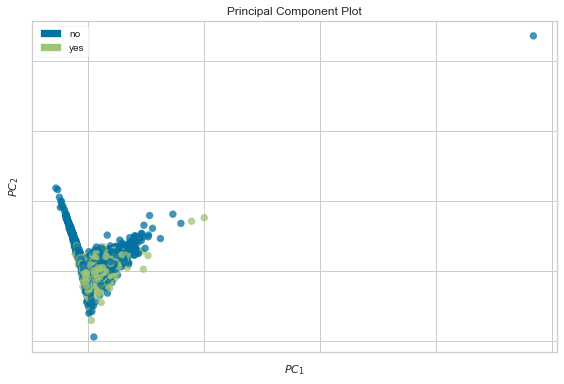

In [89]:
#Visualizacao das colunas numéricas em 2 dimensões
from yellowbrick.features import PCA
visualizer = PCA(scale=True, classes=classes)
visualizer.fit_transform(X[colunas_numericas], y)
visualizer.show()

### Encoding features

In [25]:
# Encoding features categoricas
import category_encoders as ce

In [26]:
cat_encoding = ce.CatBoostEncoder(cols=colunas_categoricas)

In [27]:
X_train[colunas_categoricas] = cat_encoding.fit_transform(X_train[colunas_categoricas], y_train)
X_test[colunas_categoricas]= cat_encoding.transform(X_test[colunas_categoricas])

/Users/tuliosouza/opt/anaconda3/envs/spark/lib/python3.8/site-packages/pandas/core/frame.py:2963: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


### Normalizando features numéricas

In [28]:
# Standart scaler features numericas
from sklearn.preprocessing import StandardScaler
std_scaler = StandardScaler()
X_train[colunas_numericas] = std_scaler.fit_transform(X_train[colunas_numericas])
X_test[colunas_numericas] = std_scaler.transform(X_test[colunas_numericas])


<ipython-input-28-852f54b6908c>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[colunas_numericas] = std_scaler.fit_transform(X_train[colunas_numericas])
/Users/tuliosouza/opt/anaconda3/envs/spark/lib/python3.8/site-packages/pandas/core/indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s
<ipython-input-28-852f54b6908c>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



### RandomUnderSampler

In [29]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

In [30]:
sampler = RandomUnderSampler()

In [31]:
X_train_s, y_train_s = sampler.fit_resample(X_train, y_train)

### Model Training

In [32]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from catboost import CatBoostClassifier

In [207]:
tested_algorithms = {'linear' : LogisticRegression(), 
                                  'decision_tree' : DecisionTreeClassifier(), 
                                  'random_forest': RandomForestClassifier(), 
                                  'svm': SVC(),
                                  'catboost': CatBoostClassifier()}

In [208]:
for modelo in tested_algorithms.keys():
    print(modelo)
    teste = tested_algorithms[modelo]
    teste.fit(X_train_s, y_train_s)
    y_pred = teste.predict(X_test)
    print(confusion_matrix(y_pred=y_pred, y_true = y_test))
    print(classification_report(y_true=y_test, y_pred = y_pred))
    fpr, tpr, thresholds = roc_curve(y_test, y_pred, pos_label=1)
    print('AUC = ', auc(fpr, tpr))
    

linear
[[6097 1115]
 [ 167  759]]
              precision    recall  f1-score   support

           0       0.97      0.85      0.90      7212
           1       0.41      0.82      0.54       926

    accuracy                           0.84      8138
   macro avg       0.69      0.83      0.72      8138
weighted avg       0.91      0.84      0.86      8138

AUC =  0.8325254944662664
decision_tree


/Users/tuliosouza/opt/anaconda3/envs/spark/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[[5737 1475]
 [ 163  763]]
              precision    recall  f1-score   support

           0       0.97      0.80      0.88      7212
           1       0.34      0.82      0.48       926

    accuracy                           0.80      8138
   macro avg       0.66      0.81      0.68      8138
weighted avg       0.90      0.80      0.83      8138

AUC =  0.8097269190178595
random_forest
[[5954 1258]
 [ 105  821]]
              precision    recall  f1-score   support

           0       0.98      0.83      0.90      7212
           1       0.39      0.89      0.55       926

    accuracy                           0.83      8138
   macro avg       0.69      0.86      0.72      8138
weighted avg       0.92      0.83      0.86      8138

AUC =  0.8560887841119132
svm
[[5974 1238]
 [ 157  769]]
              precision    recall  f1-score   support

           0       0.97      0.83      0.90      7212
           1       0.38      0.83      0.52       926

    accuracy                   

141:	learn: 0.3508817	total: 559ms	remaining: 3.38s
142:	learn: 0.3506327	total: 564ms	remaining: 3.38s
143:	learn: 0.3504103	total: 571ms	remaining: 3.39s
144:	learn: 0.3498956	total: 576ms	remaining: 3.4s
145:	learn: 0.3494151	total: 582ms	remaining: 3.4s
146:	learn: 0.3489425	total: 586ms	remaining: 3.4s
147:	learn: 0.3485661	total: 590ms	remaining: 3.4s
148:	learn: 0.3481735	total: 594ms	remaining: 3.39s
149:	learn: 0.3478711	total: 597ms	remaining: 3.38s
150:	learn: 0.3476183	total: 600ms	remaining: 3.37s
151:	learn: 0.3472335	total: 604ms	remaining: 3.37s
152:	learn: 0.3468344	total: 607ms	remaining: 3.36s
153:	learn: 0.3465261	total: 611ms	remaining: 3.35s
154:	learn: 0.3461853	total: 614ms	remaining: 3.35s
155:	learn: 0.3458662	total: 618ms	remaining: 3.34s
156:	learn: 0.3456986	total: 621ms	remaining: 3.33s
157:	learn: 0.3453809	total: 625ms	remaining: 3.33s
158:	learn: 0.3452142	total: 628ms	remaining: 3.32s
159:	learn: 0.3448718	total: 632ms	remaining: 3.31s
160:	learn: 0.34

342:	learn: 0.3045730	total: 1.33s	remaining: 2.54s
343:	learn: 0.3044201	total: 1.33s	remaining: 2.54s
344:	learn: 0.3042602	total: 1.33s	remaining: 2.53s
345:	learn: 0.3041004	total: 1.34s	remaining: 2.53s
346:	learn: 0.3040140	total: 1.35s	remaining: 2.53s
347:	learn: 0.3038529	total: 1.35s	remaining: 2.54s
348:	learn: 0.3037030	total: 1.37s	remaining: 2.55s
349:	learn: 0.3034917	total: 1.38s	remaining: 2.56s
350:	learn: 0.3033379	total: 1.39s	remaining: 2.58s
351:	learn: 0.3031720	total: 1.4s	remaining: 2.58s
352:	learn: 0.3029767	total: 1.42s	remaining: 2.6s
353:	learn: 0.3027999	total: 1.43s	remaining: 2.61s
354:	learn: 0.3025739	total: 1.44s	remaining: 2.62s
355:	learn: 0.3023064	total: 1.46s	remaining: 2.64s
356:	learn: 0.3020636	total: 1.47s	remaining: 2.65s
357:	learn: 0.3018845	total: 1.48s	remaining: 2.65s
358:	learn: 0.3017491	total: 1.49s	remaining: 2.65s
359:	learn: 0.3017442	total: 1.49s	remaining: 2.65s
360:	learn: 0.3015824	total: 1.5s	remaining: 2.65s
361:	learn: 0.3

511:	learn: 0.2743050	total: 2.51s	remaining: 2.39s
512:	learn: 0.2741549	total: 2.52s	remaining: 2.39s
513:	learn: 0.2740313	total: 2.52s	remaining: 2.39s
514:	learn: 0.2738059	total: 2.53s	remaining: 2.38s
515:	learn: 0.2737968	total: 2.54s	remaining: 2.38s
516:	learn: 0.2736721	total: 2.54s	remaining: 2.38s
517:	learn: 0.2735686	total: 2.55s	remaining: 2.37s
518:	learn: 0.2734137	total: 2.56s	remaining: 2.37s
519:	learn: 0.2732242	total: 2.56s	remaining: 2.37s
520:	learn: 0.2730884	total: 2.57s	remaining: 2.36s
521:	learn: 0.2729615	total: 2.58s	remaining: 2.36s
522:	learn: 0.2726324	total: 2.58s	remaining: 2.35s
523:	learn: 0.2724023	total: 2.59s	remaining: 2.35s
524:	learn: 0.2722955	total: 2.59s	remaining: 2.35s
525:	learn: 0.2721426	total: 2.6s	remaining: 2.34s
526:	learn: 0.2718812	total: 2.6s	remaining: 2.33s
527:	learn: 0.2716815	total: 2.6s	remaining: 2.33s
528:	learn: 0.2714975	total: 2.61s	remaining: 2.33s
529:	learn: 0.2713541	total: 2.62s	remaining: 2.32s
530:	learn: 0.2

709:	learn: 0.2439251	total: 3.48s	remaining: 1.42s
710:	learn: 0.2439147	total: 3.48s	remaining: 1.42s
711:	learn: 0.2437637	total: 3.49s	remaining: 1.41s
712:	learn: 0.2436063	total: 3.5s	remaining: 1.41s
713:	learn: 0.2434691	total: 3.5s	remaining: 1.4s
714:	learn: 0.2432721	total: 3.5s	remaining: 1.4s
715:	learn: 0.2430938	total: 3.51s	remaining: 1.39s
716:	learn: 0.2429654	total: 3.51s	remaining: 1.39s
717:	learn: 0.2428544	total: 3.52s	remaining: 1.38s
718:	learn: 0.2427337	total: 3.52s	remaining: 1.38s
719:	learn: 0.2425204	total: 3.53s	remaining: 1.37s
720:	learn: 0.2423993	total: 3.53s	remaining: 1.37s
721:	learn: 0.2422936	total: 3.54s	remaining: 1.36s
722:	learn: 0.2420971	total: 3.54s	remaining: 1.36s
723:	learn: 0.2420037	total: 3.55s	remaining: 1.35s
724:	learn: 0.2419161	total: 3.55s	remaining: 1.35s
725:	learn: 0.2417572	total: 3.56s	remaining: 1.34s
726:	learn: 0.2416444	total: 3.56s	remaining: 1.34s
727:	learn: 0.2415721	total: 3.57s	remaining: 1.33s
728:	learn: 0.241

897:	learn: 0.2209766	total: 4.65s	remaining: 529ms
898:	learn: 0.2209099	total: 4.66s	remaining: 524ms
899:	learn: 0.2208333	total: 4.67s	remaining: 519ms
900:	learn: 0.2206972	total: 4.68s	remaining: 514ms
901:	learn: 0.2205711	total: 4.68s	remaining: 509ms
902:	learn: 0.2205269	total: 4.69s	remaining: 504ms
903:	learn: 0.2204036	total: 4.69s	remaining: 498ms
904:	learn: 0.2202916	total: 4.7s	remaining: 493ms
905:	learn: 0.2201563	total: 4.7s	remaining: 488ms
906:	learn: 0.2200505	total: 4.71s	remaining: 483ms
907:	learn: 0.2198739	total: 4.71s	remaining: 477ms
908:	learn: 0.2197030	total: 4.71s	remaining: 472ms
909:	learn: 0.2195431	total: 4.72s	remaining: 467ms
910:	learn: 0.2194129	total: 4.72s	remaining: 461ms
911:	learn: 0.2193261	total: 4.73s	remaining: 456ms
912:	learn: 0.2192343	total: 4.73s	remaining: 451ms
913:	learn: 0.2190977	total: 4.74s	remaining: 446ms
914:	learn: 0.2189705	total: 4.74s	remaining: 440ms
915:	learn: 0.2189075	total: 4.75s	remaining: 435ms
916:	learn: 0.

### Escolhido : RandomForest

- Modelo teve o maior recall 0.89
- AUC: 0.859

In [33]:
model = RandomForestClassifier()
model.fit(X_train_s, y_train_s)

RandomForestClassifier()

In [34]:
from yellowbrick.model_selection import feature_importances

/Users/tuliosouza/opt/anaconda3/envs/spark/lib/python3.8/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


/Users/tuliosouza/opt/anaconda3/envs/spark/lib/python3.8/site-packages/sklearn/base.py:209: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  warnings.warn('From version 0.24, get_params will raise an '


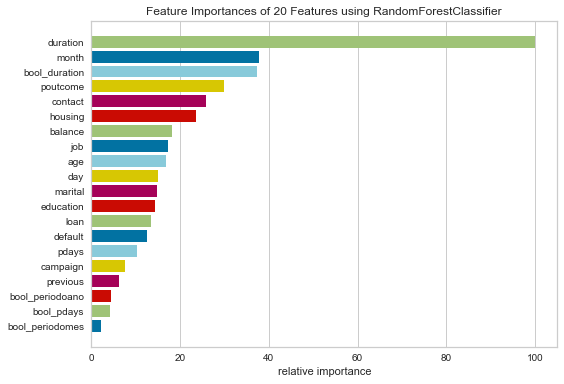

/Users/tuliosouza/opt/anaconda3/envs/spark/lib/python3.8/site-packages/sklearn/base.py:209: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  warnings.warn('From version 0.24, get_params will raise an '


FeatureImportances(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x12a0ff4f0>,
                   model=None)

In [35]:
# Use the quick method and immediately show the figure
feature_importances(model, X_train_s, y_train_s)

### Teste Feature selection

In [36]:
from sklearn.feature_selection import RFE

In [37]:
selector = RFE(model, step=1)

In [38]:
selector.fit(X_train,y_train)

RFE(estimator=RandomForestClassifier())

In [41]:
pd.DataFrame({'colunas': X_train.columns, 'features': selector.support_})


,colunas,features
0,age,True
1,job,True
2,marital,True
3,education,True
4,default,False
5,balance,True
6,housing,True
7,loan,False
8,contact,True
9,day,False


In [42]:
X_train_selection = selector.transform(X_train_s)
X_test_selection = selector.transform(X_test)

In [43]:
model = RandomForestClassifier()
model.fit(X_train_selection, y_train_s)

RandomForestClassifier()

In [44]:
y_pred_s = model.predict(X_test_selection)

In [45]:
from sklearn.metrics import classification_report

In [47]:
print(classification_report(y_pred_s, y_test))

              precision    recall  f1-score   support

           0       0.82      0.98      0.89      6006
           1       0.86      0.39      0.53      2132

    accuracy                           0.82      8138
   macro avg       0.84      0.68      0.71      8138
weighted avg       0.83      0.82      0.80      8138



#### Teste descartado